# 9. POST TRAINING ANALYSIS

In [1]:
import os 
import pandas as pd 
import numpy as np   
import seaborn as sns  
import matplotlib.pyplot as plt 
import random 
import warnings 
warnings.filterwarnings("ignore") 
import pickle 
import joblib 
from joblib import dump, load

from sklearn.metrics import confusion_matrix  
from sklearn.model_selection import train_test_split  
from sklearn.preprocessing import MinMaxScaler  
from sklearn.metrics import recall_score, precision_score,f1_score, roc_curve,auc    
from collections import Counter 
from sklearn.model_selection import RandomizedSearchCV 
from sklearn.model_selection import GridSearchCV 
from sklearn.linear_model import SGDClassifier 
from sklearn.linear_model import LogisticRegression 
from sklearn.tree import DecisionTreeClassifier 
from xgboost import XGBClassifier 
from sklearn.ensemble import RandomForestClassifier 
from lightgbm import LGBMClassifier 
from prettytable import PrettyTable 

In [2]:
from google.colab import drive  
drive.mount('/content/drive') 

Mounted at /content/drive


# 9.1. Load Test Data

In [3]:
df2 = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AAIC ASSIGNMENT/Case Study 1/Post_training/test_ID.csv")
df2.drop(columns=["Unnamed: 0"],axis=1,inplace=True) 
df2.head(2) 

,Provider,PotentialFraud,BeneID,Gender,Race,RenalDiseaseIndicator,State,County,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DiagnosisGroupCode,Age_Of_Patients,Hospital_stay_Duration,Claim_Duration,Amount_left_reimburse,Diagnosis_Code_4019,Diagnosis_Code_25000,Diagnosis_Code_2724,Diagnosis_Code_V5869,Diagnosis_Code_4011,Diagnosis_Code_42731,Diagnosis_Code_V5861,Diagnosis_Code_2720,Diagnosis_Code_2449,Diagnosis_Code_4280,Procedure_Code_4019.0,Procedure_Code_9904.0,Procedure_Code_2724.0,Procedure_Code_8154.0,Procedure_Code_66.0,Procedure_Code_3893.0,Procedure_Code_3995.0,Procedure_Code_4516.0,Procedure_Code_3722.0,Procedure_Code_8151.0
0,PRV55218,0,BENE20979,1,2,0,34,120,2,2,2,2,2,2,2,2,2,2,2,50,PHY406714,0,PHY317249,0,0.0,0,51.0,0.0,0,-260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,PRV55030,1,BENE99938,2,1,0,33,540,1,1,1,2,1,1,1,1,2,1,1,500,PHY409629,0,0,0,0.0,0,84.0,0.0,0,3952,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [4]:
df = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AAIC ASSIGNMENT/Case Study 1/Post_training/test.csv")
df.drop(columns=["Unnamed: 0"],axis=1,inplace=True)
df_X_test = df.copy()
df_X_test.shape 

(111643, 49)

In [5]:
df_y_test = pd.read_csv("/content/drive/MyDrive/Colab Notebooks/AAIC ASSIGNMENT/Case Study 1/Post_training/ytest.csv")
df_y_test.drop(columns=["Unnamed: 0"],axis=1,inplace=True)

# 9.1.1. Scaling Columns  

In [6]:
# Normalizing data
scale_columns = ["Provider","BeneID","Race","State","County","InscClaimAmtReimbursed",
                 "AttendingPhysician","OperatingPhysician","OtherPhysician",
                 "ClmAdmitDiagnosisCode","DeductibleAmtPaid","DiagnosisGroupCode",
                 "Age_Of_Patients","Hospital_stay_Duration","Claim_Duration","Amount_left_reimburse"]

In [7]:
for i in scale_columns:
  scale = load('/content/drive/MyDrive/Colab Notebooks/AAIC ASSIGNMENT/Case Study 1/Post_training/scale_cols/'+i+'_std_scaler.bin')
  scale.clip = False
  df_X_test[i] = scale.transform(df_X_test[i].values.reshape(-1,1))

# 9.1.2. Best Model (Decision Tree)

In [8]:
model = pickle.load(open("/content/drive/MyDrive/Colab Notebooks/AAIC ASSIGNMENT/Case Study 1/Post_training/model.pkl","rb")) 

In [9]:
y_pred  = model.predict(df_X_test)
y_prob = model.predict_proba(df_X_test) 

In [16]:
df_y_test["PotentialFraud_Predicted"] = y_pred
df_y_test["PotentialFraud_Probability"] = y_prob
df_y_test["Prediction"] = np.where(df_y_test["PotentialFraud"]==df_y_test["PotentialFraud_Predicted"],"Yes","No")
df_y_test.head(2) 

,PotentialFraud,PotentialFraud_Predicted,PotentialFraud_Probability,Prediction
0,0,0,1.0,Yes
1,1,1,0.0,Yes


In [17]:
df_y_test["PotentialFraud_Probability"].value_counts()

1.000000    68748
0.000000    42377
0.381129      158
0.551909      117
0.170319       84
0.648819       81
0.235429       78
Name: PotentialFraud_Probability, dtype: int64

In [18]:
df["PotentialFraud"] = df_y_test["PotentialFraud"]
df["PotentialFraud_Predicted"] = df_y_test["PotentialFraud_Predicted"]
df["PotentialFraud_Probability"] = df_y_test["PotentialFraud_Probability"]
df["Prediction"] = df_y_test["Prediction"]
df.head(2)

,Provider,BeneID,Gender,Race,RenalDiseaseIndicator,State,County,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DiagnosisGroupCode,Age_Of_Patients,Hospital_stay_Duration,Claim_Duration,Amount_left_reimburse,Diagnosis_Code_4019,Diagnosis_Code_25000,Diagnosis_Code_2724,Diagnosis_Code_V5869,Diagnosis_Code_4011,Diagnosis_Code_42731,Diagnosis_Code_V5861,Diagnosis_Code_2720,Diagnosis_Code_2449,Diagnosis_Code_4280,Procedure_Code_4019.0,Procedure_Code_9904.0,Procedure_Code_2724.0,Procedure_Code_8154.0,Procedure_Code_66.0,Procedure_Code_3893.0,Procedure_Code_3995.0,Procedure_Code_4516.0,Procedure_Code_3722.0,Procedure_Code_8151.0,PotentialFraud,PotentialFraud_Predicted,PotentialFraud_Probability,Prediction
0,94,2,1,2,0,34,120,2,2,2,2,2,2,2,2,2,2,2,50,2,443764,4,412312,0.0,517737,51.0,0.0,0,-260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,Yes
1,311,3,2,1,0,33,540,1,1,1,2,1,1,1,1,2,1,1,500,4,443764,358475,412312,0.0,517737,84.0,0.0,0,3952,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,Yes


**Correct_Predicted_data**

In [19]:
correct_predicted_index = df[df["Prediction"]=="Yes"].index
print(correct_predicted_index.shape)   

(109852,)


In [20]:
correct_predicted_data = df.iloc[correct_predicted_index]
correct_predicted_data.head(2)   

,Provider,BeneID,Gender,Race,RenalDiseaseIndicator,State,County,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DiagnosisGroupCode,Age_Of_Patients,Hospital_stay_Duration,Claim_Duration,Amount_left_reimburse,Diagnosis_Code_4019,Diagnosis_Code_25000,Diagnosis_Code_2724,Diagnosis_Code_V5869,Diagnosis_Code_4011,Diagnosis_Code_42731,Diagnosis_Code_V5861,Diagnosis_Code_2720,Diagnosis_Code_2449,Diagnosis_Code_4280,Procedure_Code_4019.0,Procedure_Code_9904.0,Procedure_Code_2724.0,Procedure_Code_8154.0,Procedure_Code_66.0,Procedure_Code_3893.0,Procedure_Code_3995.0,Procedure_Code_4516.0,Procedure_Code_3722.0,Procedure_Code_8151.0,PotentialFraud,PotentialFraud_Predicted,PotentialFraud_Probability,Prediction
0,94,2,1,2,0,34,120,2,2,2,2,2,2,2,2,2,2,2,50,2,443764,4,412312,0.0,517737,51.0,0.0,0,-260,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1.0,Yes
1,311,3,2,1,0,33,540,1,1,1,2,1,1,1,1,2,1,1,500,4,443764,358475,412312,0.0,517737,84.0,0.0,0,3952,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,1,0.0,Yes


**Wrong_Predicted_data**

In [21]:
wrong_predicted_index = df[df["Prediction"]=="No"].index 
print(wrong_predicted_index.shape) 

(1791,)


In [22]:
wrong_predicted_data = df.iloc[wrong_predicted_index]
wrong_predicted_data.head(2)  

,Provider,BeneID,Gender,Race,RenalDiseaseIndicator,State,County,ChronicCond_Alzheimer,ChronicCond_Heartfailure,ChronicCond_KidneyDisease,ChronicCond_Cancer,ChronicCond_ObstrPulmonary,ChronicCond_Depression,ChronicCond_Diabetes,ChronicCond_IschemicHeart,ChronicCond_Osteoporasis,ChronicCond_rheumatoidarthritis,ChronicCond_stroke,InscClaimAmtReimbursed,AttendingPhysician,OperatingPhysician,OtherPhysician,ClmAdmitDiagnosisCode,DeductibleAmtPaid,DiagnosisGroupCode,Age_Of_Patients,Hospital_stay_Duration,Claim_Duration,Amount_left_reimburse,Diagnosis_Code_4019,Diagnosis_Code_25000,Diagnosis_Code_2724,Diagnosis_Code_V5869,Diagnosis_Code_4011,Diagnosis_Code_42731,Diagnosis_Code_V5861,Diagnosis_Code_2720,Diagnosis_Code_2449,Diagnosis_Code_4280,Procedure_Code_4019.0,Procedure_Code_9904.0,Procedure_Code_2724.0,Procedure_Code_8154.0,Procedure_Code_66.0,Procedure_Code_3893.0,Procedure_Code_3995.0,Procedure_Code_4516.0,Procedure_Code_3722.0,Procedure_Code_8151.0,PotentialFraud,PotentialFraud_Predicted,PotentialFraud_Probability,Prediction
11,49,10,2,1,0,54,999,2,1,2,2,1,1,1,1,1,1,2,80,2,5,1,412312,0.0,517737,69.0,0.0,0,5312,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1.0,No
269,76,4,2,1,0,29,10,1,2,2,2,2,2,1,2,2,2,2,20,1,443764,358475,412312,0.0,517737,67.0,0.0,0,460,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,1.0,No


# 9.2. Exploratory Data Analysis(Post Training Analysis)

# 9.2.1. Univariate Analysis

## 9.2.1.1. Provider

<Figure size 1440x720 with 0 Axes>

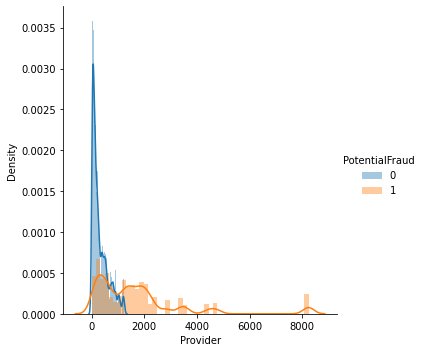

In [23]:
plt.figure(figsize=(20,10))
sns.FacetGrid(correct_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "Provider").add_legend()

**Observation:** 

1) Fradulent occur is more than Non-fraudulent occur by Provider in correct_predicted_data.

2) Non-Fraudulent occur from 0 to less than 2000 by count of Provider in correct_predicted_data.    

<Figure size 1080x360 with 0 Axes>

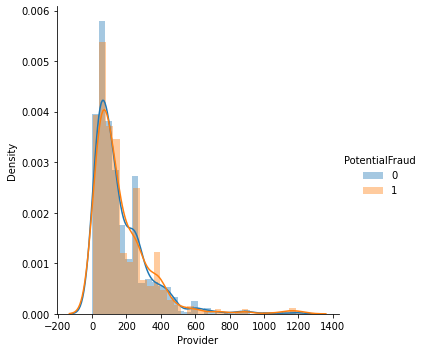

In [24]:
plt.figure(figsize=(15,5))
sns.FacetGrid(wrong_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "Provider").add_legend()
plt.show()

**Observation:** 

1) Fradulent occur is almost equal to Non-fraudulent occur by Provider in wrong_predicted_data.

2) Provider count also has values less than 0 as well.

3) Maximum Fraudulent occur between count 0 to 400.

4) Non-Fradulent occur between count 0 to 400 but Fraudulent is more which model predicted wrongly.  

## 9.2.1.2. State

<Figure size 1080x360 with 0 Axes>

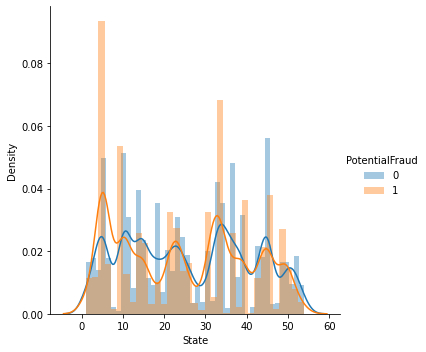

In [25]:
plt.figure(figsize=(15,5))
sns.FacetGrid(correct_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "State").add_legend()
plt.show()

**Observation:** 

1) Fradulent occur is more than Non-fraudulent occur by Provider in correct_predicted_data.

2) Maximum Fradulent occur at State Code between 0 to 10 and 30 to 40.     

<Figure size 1080x360 with 0 Axes>

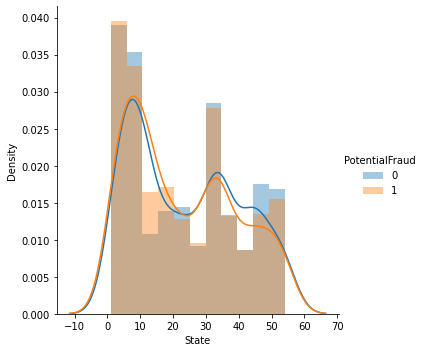

In [26]:
plt.figure(figsize=(15,5))
sns.FacetGrid(wrong_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "State").add_legend()
plt.show()

**Observation:** 

1) Fradulent occur is almost equal to Non-fraudulent occur by Provider in wrong_predicted_data.

2) Provider count also has values less than 0 as well.

3) Maximum Fraudulent occur at State Code 10 to 20.

4) Non-Fradulent occur at State Code 0 to 10 and 30 to 40 but Fraudulent is more as per correct_predicted_data of this State Code which model predicted wrongly.  

## 9.2.1.3. Amount_left_reimburse

<Figure size 1080x360 with 0 Axes>

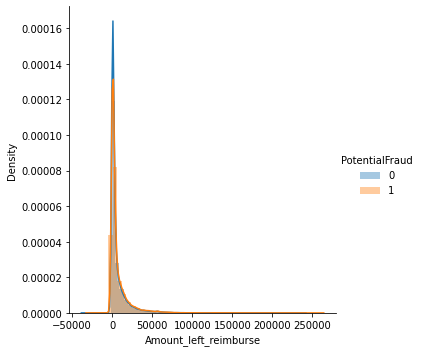

In [27]:
plt.figure(figsize=(15,5))
sns.FacetGrid(correct_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "Amount_left_reimburse").add_legend()
plt.show()

**Observation:** 

1) Non-Fradulent occur is more than fraudulent occur from Amount_left_reimburse in correct_predicted_data.

2) Left Amount of reimbursement is almost 50,000.    

<Figure size 1080x360 with 0 Axes>

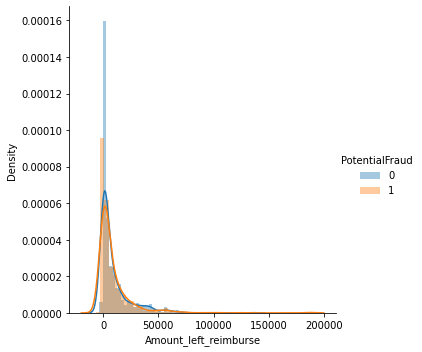

In [28]:
plt.figure(figsize=(15,5))
sns.FacetGrid(wrong_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "Amount_left_reimburse").add_legend()
plt.show()

**Observation:** 

1) Non-Fradulent occur is more than fraudulent occur from Amount_left_reimburse in wrong_predicted_data.

2) Amount_left_reimburse count also has values less than 0 as well.

3) In wrong_predicted_data has Amount_left_reimburse are somewhat more than 50,000. 

## 9.2.1.4. AttendingPhysician

<Figure size 1080x360 with 0 Axes>

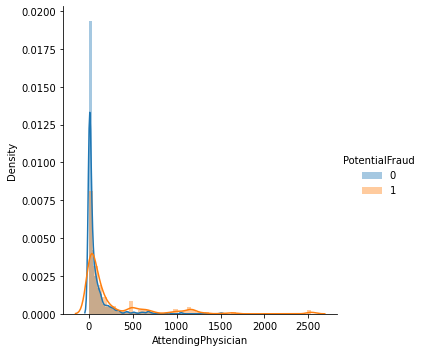

In [29]:
plt.figure(figsize=(15,5))
sns.FacetGrid(correct_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "AttendingPhysician").add_legend()
plt.show()

**Observation:** 

1) Non-Fradulent occur is more than fraudulent occur by AttendingPhysician in correct_predicted_data.  

<Figure size 1080x360 with 0 Axes>

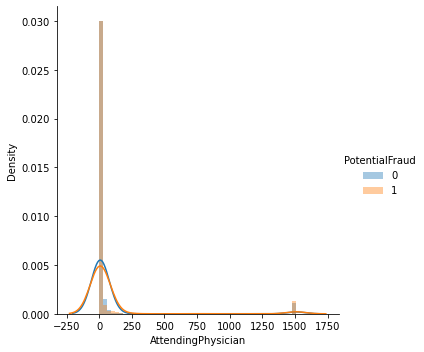

In [30]:
plt.figure(figsize=(15,5))
sns.FacetGrid(wrong_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "AttendingPhysician").add_legend()
plt.show()

**Observation:** 

1) From wrong_predicted_data for AttendingPhysician, we are not able to make any conclusion.  
  

## 9.2.1.5. Age_Of_Patients

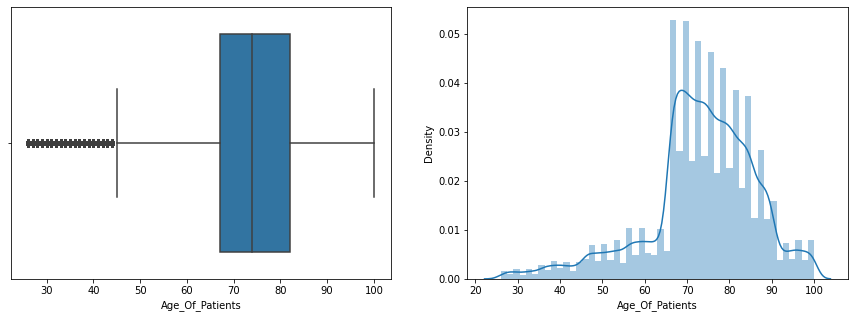

In [31]:
plt.subplots(1,2,figsize=(15,5))
plt.subplot(1, 2, 1)
sns.boxplot(x='Age_Of_Patients', data = correct_predicted_data)
plt.subplot(1, 2, 2)
sns.distplot(correct_predicted_data['Age_Of_Patients'])
plt.show()

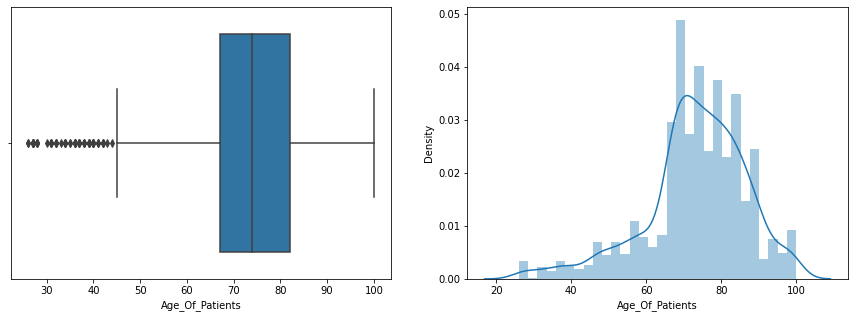

In [32]:
plt.subplots(1,2,figsize=(15,5))
plt.subplot(1, 2, 1)
sns.boxplot(x='Age_Of_Patients', data = wrong_predicted_data)
plt.subplot(1, 2, 2)
sns.distplot(wrong_predicted_data['Age_Of_Patients'])
plt.show()

**Observation:** 

1) From correct_predicted_data and wrong_predicted_data we cannot able to make any conclusion from Age_Of_Patients column.

## 9.2.1.6. DiagnosisGroupCode

<Figure size 1080x360 with 0 Axes>

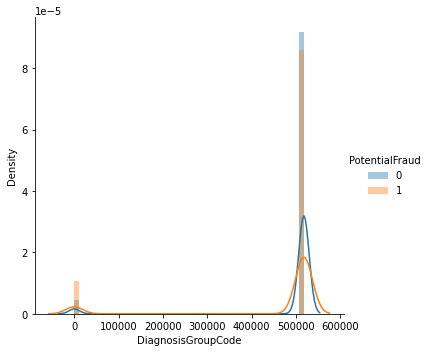

In [33]:
plt.figure(figsize=(15,5))
sns.FacetGrid(correct_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "DiagnosisGroupCode").add_legend()
plt.show()

**Observation:** 

1) DiagnosisGroupCode at 0 has density less than 2 for correct_predicted_data. while at 50,000 has density almost at 9 for correct_predicted_data.

<Figure size 1080x360 with 0 Axes>

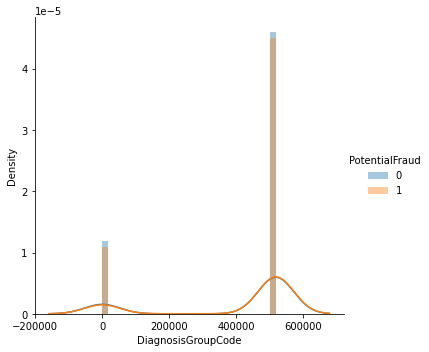

In [34]:
plt.figure(figsize=(15,5))
sns.FacetGrid(wrong_predicted_data, hue="PotentialFraud", size=5).map(sns.distplot, "DiagnosisGroupCode").add_legend()
plt.show()

**Observation:** 

1) DiagnosisGroupCode at 0 has density slight more than 1 for wrong_predicted_data. while at 50,000 has density almost at 5 for wrong_predicted_data.

# 9.2.2. Bivariate Analysis

## 9.2.2.1. Provider vs Amount_left_reimburse

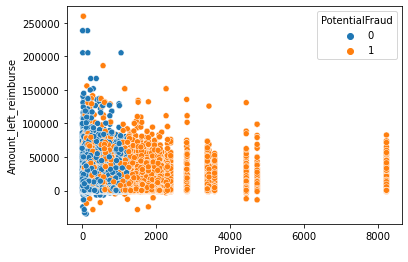

In [35]:
sns.scatterplot(x="Provider",y="Amount_left_reimburse",data=correct_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for Provider vs Amount_left_reimburse, we can get idea that amount left reimburse between 0 to 150000 with provider code between 0 to 1000 there overlap between Fraudulent and Non-Fraudulent.

2) Above Provider Code 1000, almost all providers involve in Fraudulent where amount left reimburse are below 150,000 as per correct_predicted_data. 

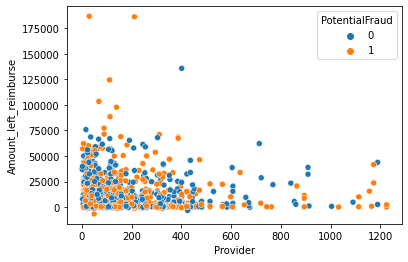

In [36]:
sns.scatterplot(x="Provider",y="Amount_left_reimburse",data=wrong_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for Provider vs Amount_left_reimburse, we can get idea that amount left reimburse between 0 to 75000 with provider code between 0 to 1000 there overlap between Fraudulent and Non-Fraudulent.

## 9.2.2.2. AttendingPhysician vs Amount_left_reimburse

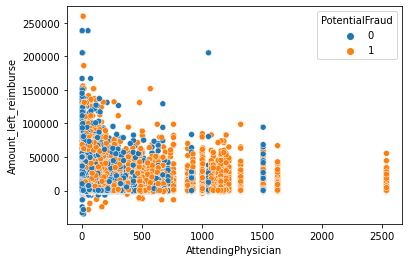

In [37]:
sns.scatterplot(x="AttendingPhysician",y="Amount_left_reimburse",data=correct_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for AttendingPhysician vs Amount_left_reimburse, we can get idea that amount left reimburse between 0 to 150000 with AttendingPhysician code between 0 to 800 there overlap between Fraudulent and Non-Fraudulent. But we can see that Maximum Fraud has occured between 0 to 800 which are codes of AttendingPhysician.

2) Above AttendingPhysician Code 1000, almost all AttendingPhysician involve in Fraudulent where amount left reimburse are below 100,000 as per correct_predicted_data. 

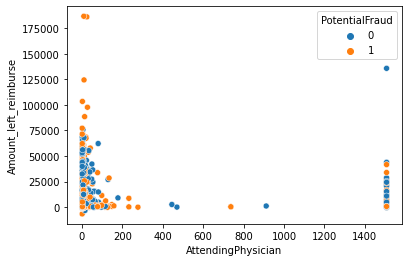

In [38]:
sns.scatterplot(x="AttendingPhysician",y="Amount_left_reimburse",data=wrong_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for AttendingPhysicain vs Amount_left_reimburse, we can get idea that amount left reimburse between 0 to 75000 with attendingPhysician code between 0 to 200 there overlap between Fraudulent and Non-Fraudulent.

## 9.2.2.3. AttendingPhysician vs State

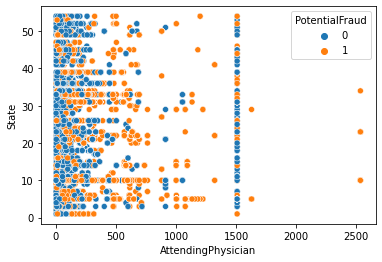

In [39]:
sns.scatterplot(x="AttendingPhysician",y="State",data=correct_predicted_data,hue="PotentialFraud")

**Observation**

1) There is Overlap of Fraudulent and Non-Fraudulent, we cannot able to make any Conclusion. 

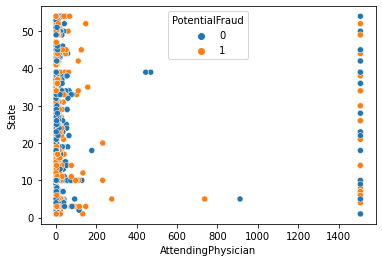

In [40]:
sns.scatterplot(x="AttendingPhysician",y="State",data=wrong_predicted_data,hue="PotentialFraud")

**Observation**

1) There is Overlap of Fraudulent and Non-Fraudulent, we cannot able to make any Conclusion. 

## 9.2.2.4. Provider vs Age_Of_Patients

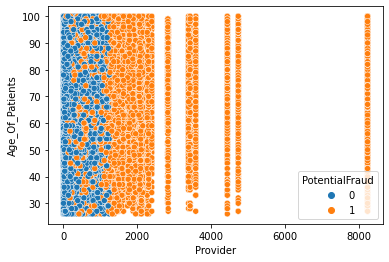

In [41]:
sns.scatterplot(x="Provider",y="Age_Of_Patients",data=correct_predicted_data,hue="PotentialFraud")

**Observation**

1) Almost of all age of patients where involve in Fraudulent and Non-fraudulent

2) There is Overlap of Fraudulent and Non-Fraudulent, we cannot able to make any Conclusion. 

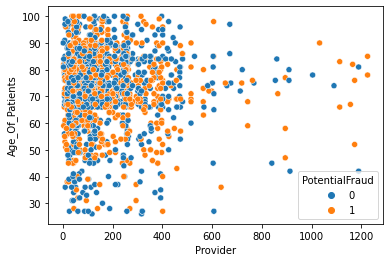

In [42]:
sns.scatterplot(x="Provider",y="Age_Of_Patients",data=wrong_predicted_data,hue="PotentialFraud")

**Observation**

1) Maximum Fraudulent and Non-Fraudulent occur between 45 to 90.

2) There is Overlap of Fraudulent and Non-Fraudulent, we cannot able to make any Conclusion. 

## 9.2.2.5. Provider vs InscClaimAmtReimbursed

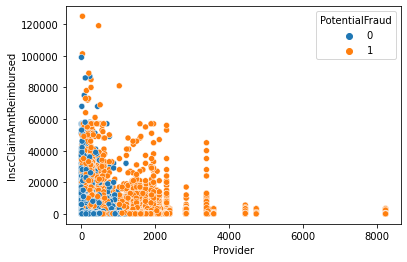

In [43]:
sns.scatterplot(x="Provider",y="InscClaimAmtReimbursed",data=correct_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for Provider vs InscClaimAmtReimburesed, we can get idea that InscClaimAmtReimburesed between 0 to 80000 with Provider code between 0 to 1000 there overlap between Fraudulent and Non-Fraudulent. But we can see that Maximum Fraud has occured between 0 to 2000 which are codes of Provider.

2) Above Provider Code 1000, almost all Provider involve in Fraudulent where InscClaimAmtReimburesed are below 60,000 as per correct_predicted_data. 

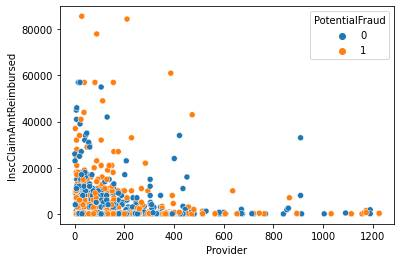

In [44]:
sns.scatterplot(x="Provider",y="InscClaimAmtReimbursed",data=wrong_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for Provider vs InscClaimAmtReimbursed, we can get idea that InscClaimAmtReimbursed between 0 to 20000 with Provider code between 0 to 400 there overlap between Fraudulent and Non-Fraudulent.

## 9.2.2.6. BeneID vs InscClaimAmtReimbursed

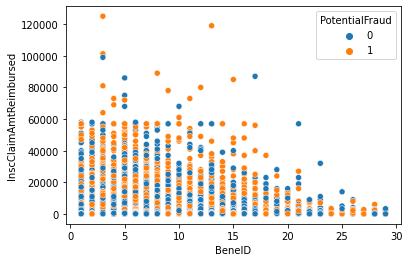

In [45]:
sns.scatterplot(x="BeneID",y="InscClaimAmtReimbursed",data=correct_predicted_data,hue="PotentialFraud")

**Observation**

1) There is Overlap of Fraudulent and Non-Fraudulent, we cannot able to make any Conclusion. 

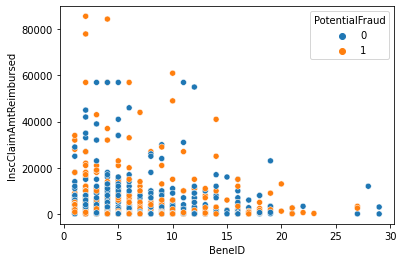

In [46]:
sns.scatterplot(x="BeneID",y="InscClaimAmtReimbursed",data=wrong_predicted_data,hue="PotentialFraud")

**Observation**

1) There is Overlap of Fraudulent and Non-Fraudulent, we cannot able to make any Conclusion. 

## 9.2.2.7. AttendingPhysician vs InscClaimAmtReimbursed

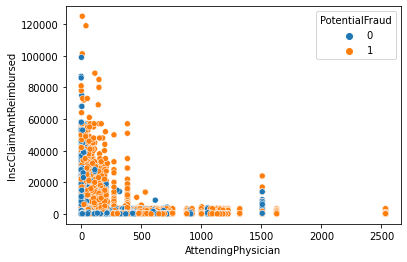

In [47]:
sns.scatterplot(x="AttendingPhysician",y="InscClaimAmtReimbursed",data=correct_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for AttendingPhysician vs InscClaimAmtReimburesed, we can get idea that InscClaimAmtReimburesed between 0 to 80000 with attendingPhysician code between 0 to 500 there overlap between Fraudulent and Non-Fraudulent. But we can see that Maximum Fraud has occured between 0 to 1000 which are codes of attendingPhysician.

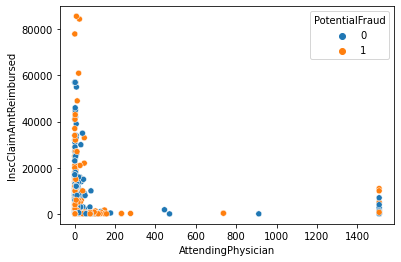

In [48]:
sns.scatterplot(x="AttendingPhysician",y="InscClaimAmtReimbursed",data=wrong_predicted_data,hue="PotentialFraud")

**Observation**

1) When we plot for AttendingPhysicain vs InscClaimAmtReimbursed, we can get idea that InscClaimAmtReimbursed between 0 to 50000 with attendingPhysician code between 0 to 200 there overlap between Fraudulent and Non-Fraudulent.

# 9.2.3. PairPlots

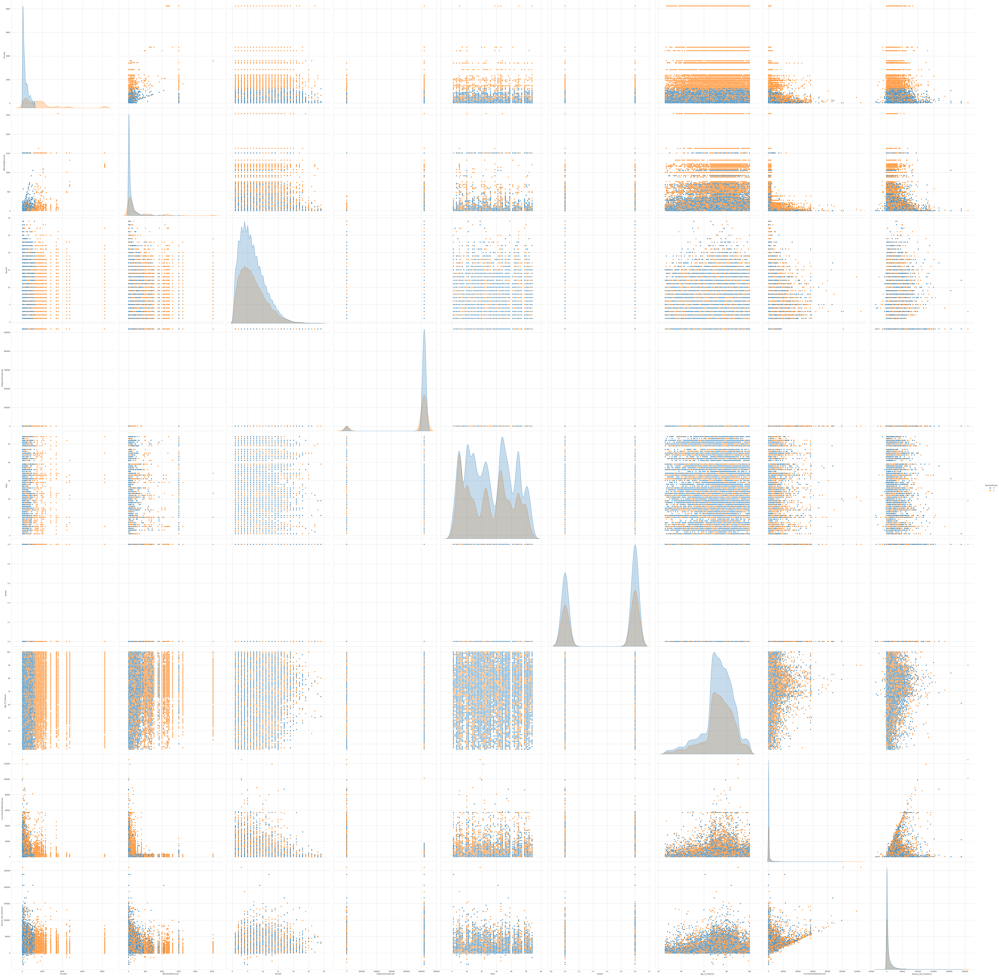

In [49]:
plt.close()
sns.set_style("whitegrid")
sns.pairplot(correct_predicted_data, vars = ['Provider','AttendingPhysician','BeneID','DiagnosisGroupCode','State','Gender','Age_Of_Patients','InscClaimAmtReimbursed','Amount_left_reimburse'],hue="PotentialFraud", size=9)
plt.show()

**Observation**

1) We get an idea that from correct_predicted_data there are almost Fraudulent and Non-Fraudent are overlapping.

2) We can separate or draw a straight between two points as Fraudulent and non-fraudulent points are overlapping.

<Figure size 1440x1440 with 0 Axes>

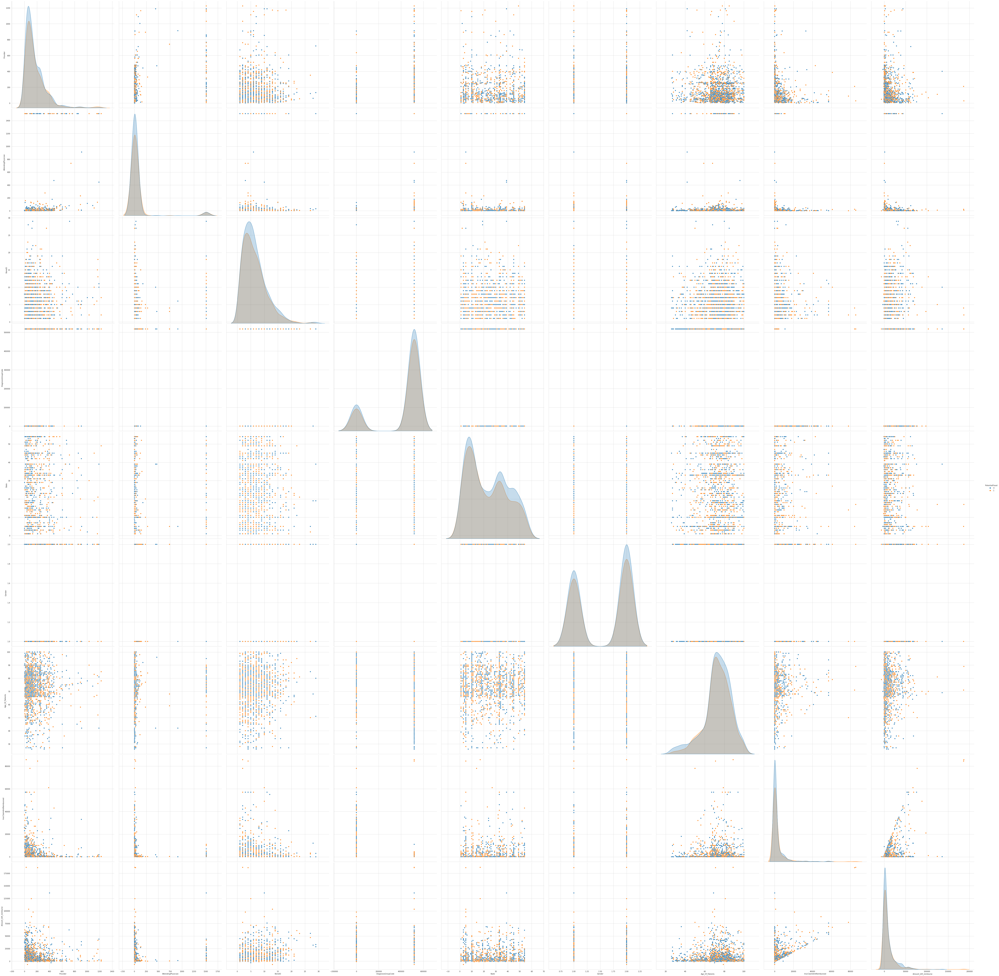

In [50]:
plt.figure(figsize=(20,20))
sns.set_style("whitegrid")
sns.pairplot(wrong_predicted_data, vars = ['Provider','AttendingPhysician','BeneID','DiagnosisGroupCode','State','Gender','Age_Of_Patients','InscClaimAmtReimbursed','Amount_left_reimburse'],hue="PotentialFraud", size=9)
plt.show()

**Observation**

1) We get an idea that from wrong_predicted_data there are almost Fraudulent and Non-Fraudent are overlapping.

2) There are almost equal number of datapoints of Fraudulent and NOn-Fraudulent.

3) We can separate or draw a straight between two points as Fraudulent and non-fraudulent points are overlapping.

# 9.3. Check Positive and Negative datapoints 

# 9.3.1. Positive and Negative Classes Present in Correct_Predicted_data

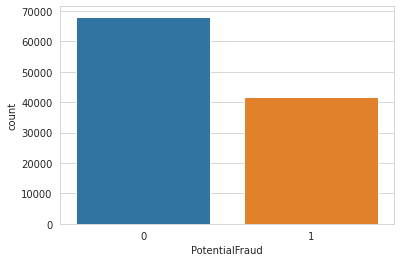

The Total Actual Positive points are:  68101
The Total Actual Negative points are:  41751


In [51]:
sns.countplot("PotentialFraud",data=correct_predicted_data)
plt.show()

print("="*50)
print("The Total Actual Positive points are: ",correct_predicted_data["PotentialFraud"].value_counts()[0])
print("="*50)
print("The Total Actual Negative points are: ",correct_predicted_data["PotentialFraud"].value_counts()[1])
print("="*50)

**Observation**

1) Number of True Positive are higher than True Negative. 

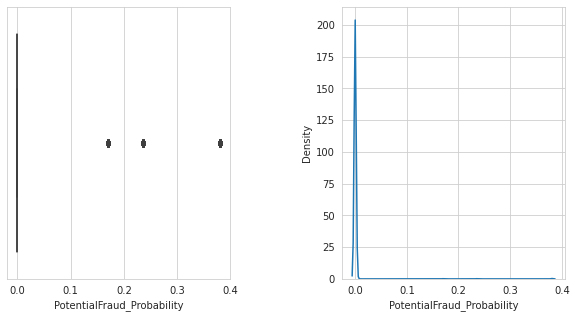

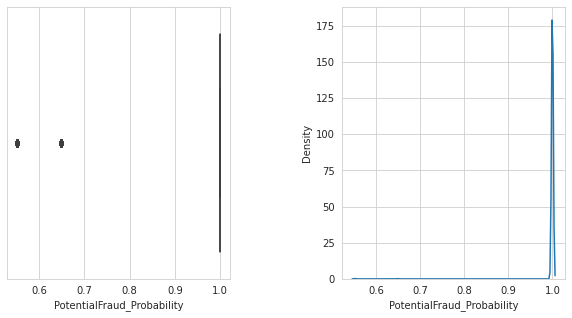

Total no. of True positives:  41751
No. of True Positives with probability equal than 0.0:  41629
No. of True Positives with probability greater than 0.30:  59
No. of True positives with probability less than 0.30:  41692
Total no. of True Negatives:  68101
No. of True Negatives with probability equal than 1.0:  0
No. of True Negatives with probability greater than 0.70:  67960
No. of True Negatives with probability less than 0.70:  141


In [52]:
## True positives:- model correctly predicts the positive class. They done Fraud it is correctly classified by model.
f, ax = plt.subplots(1,2,figsize=(10,5))
d = correct_predicted_data[correct_predicted_data['PotentialFraud'] == 1]
plt.subplot(1, 2, 1)
sns.boxplot(x='PotentialFraud_Probability', data=d)
plt.subplot(1, 2, 2)
sns.kdeplot(x='PotentialFraud_Probability', data=d)
plt.subplots_adjust(wspace=0.5)
plt.show()

## True negatives:- model correctly predicts the negative class. They are non-Fraud it is correctly classified by model.
f, ax = plt.subplots(1,2,figsize=(10,5))
d1 = correct_predicted_data[correct_predicted_data['PotentialFraud'] == 0]
plt.subplot(1, 2, 1)
sns.boxplot(x='PotentialFraud_Probability', data=d1)
plt.subplot(1, 2, 2)
sns.kdeplot(x='PotentialFraud_Probability', data=d1)
plt.subplots_adjust(wspace=0.5)
plt.show()

print("="*100)
print("Total no. of True positives: ", len(d))
print("No. of True Positives with probability equal than 0.0: ", len(d[d['PotentialFraud_Probability']==0.0]))
print("No. of True Positives with probability greater than 0.30: ", len(d[d['PotentialFraud_Probability']>0.3]))
print("No. of True positives with probability less than 0.30: ", len(d[d['PotentialFraud_Probability']<0.3]))
print("="*100)
print("Total no. of True Negatives: ", len(d1))
print("No. of True Negatives with probability equal than 1.0: ", len(d1[d1['PotentialFraud_Probability']>1.0]))
print("No. of True Negatives with probability greater than 0.70: ", len(d1[d1['PotentialFraud_Probability']>0.7]))
print("No. of True Negatives with probability less than 0.70: ", len(d1[d1['PotentialFraud_Probability']<0.7]))
print("="*100)

**Observation**

1) Number of True Positives with Probability greater than 0.30 are 59. while Number of True Negatives with Probability greater than 0.7 are 67960.

2) Number of True Positives with Probability less than 0.30 are 41692. while Number of True Negatives with Probability less than 0.7 are 141.

3) Number of True Positives with Probability equal to 0.0 are 41692. while Number of True Negatives with Probability equal to 1.0 are 0.

4) We can make conclusion that majority of correct classified points for True positives has probability less than 0.5 while majority of correct classified points for True negatives has probability greater than 0.5 by best model. 


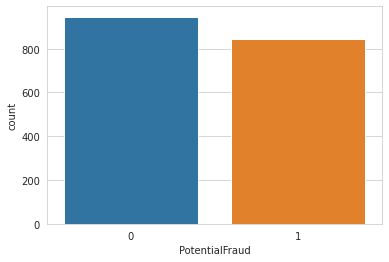

The Total Actual Positive points are:  946
The Total Actual Negative points are:  845


In [53]:
sns.countplot("PotentialFraud",data=wrong_predicted_data)
plt.show()

print("="*50)
print("The Total Actual Positive points are: ",wrong_predicted_data["PotentialFraud"].value_counts()[0])
print("="*50)
print("The Total Actual Negative points are: ",wrong_predicted_data["PotentialFraud"].value_counts()[1])
print("="*50)

**Observation**

1) Number of False Positive is higher than False Negative.


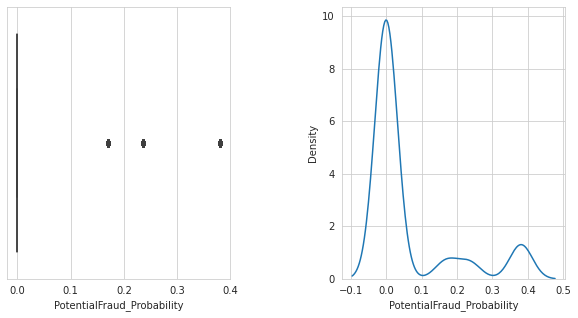

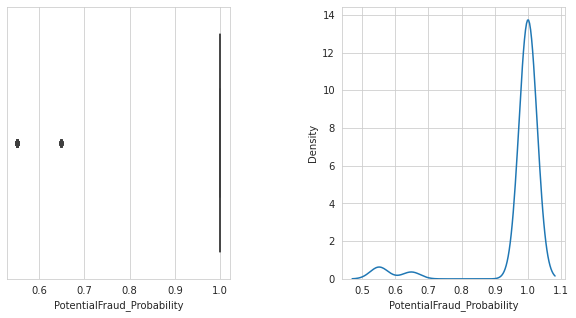

Total no. of False positives:  946
No. of False Positives with probability equal than 0.0:  748
No. of False Positives with probability greater than 0.30:  99
No. of False positives with probability less than 0.30:  847
Total no. of False Negatives:  845
No. of False Negatives with probability equal than 1.0:  788
No. of False Negatives with probability less than 0.80:  57


In [54]:
# false positives:- model incorrectly predicts the positive class. Model predict that it is a Fraudulent but actually it is not a Fraudulent
f, ax = plt.subplots(1,2,figsize=(10,5))
d = wrong_predicted_data[wrong_predicted_data['PotentialFraud'] == 0]
plt.subplot(1, 2, 1)
sns.boxplot(x='PotentialFraud_Probability', data=d)
plt.subplot(1, 2, 2)
sns.kdeplot(x='PotentialFraud_Probability', data=d)
plt.subplots_adjust(wspace=0.5)
plt.show()

# false negatives:- model incorrectly predicts the positive class. Model predict that it is not a Fraudulent but actually it is a Fraudulent
f, ax = plt.subplots(1,2,figsize=(10,5))
d1 = wrong_predicted_data[wrong_predicted_data['PotentialFraud'] == 1]
plt.subplot(1, 2, 1)
sns.boxplot(x='PotentialFraud_Probability', data=d1)
plt.subplot(1, 2, 2)
sns.kdeplot(x='PotentialFraud_Probability', data=d1)
plt.subplots_adjust(wspace=0.5)
plt.show()

print("="*100)
print("Total no. of False positives: ", len(d))
print("No. of False Positives with probability equal than 0.0: ", len(d[d['PotentialFraud_Probability']==0.0]))
print("No. of False Positives with probability greater than 0.30: ", len(d[d['PotentialFraud_Probability']>0.3]))
print("No. of False positives with probability less than 0.30: ", len(d[d['PotentialFraud_Probability']<0.3]))
print("="*100)
print("Total no. of False Negatives: ", len(d1))
print("No. of False Negatives with probability equal than 1.0: ", len(d1[d1['PotentialFraud_Probability']==1.0]))
print("No. of False Negatives with probability less than 0.80: ", len(d1[d1['PotentialFraud_Probability']<0.8]))
print("="*100)

**Observation**

1) Number of False Positives with Probability greater than 0.30 are 99. while Number of False Negatives with Probability greater than 0.80 are 788.

2) Number of False Positives with Probability less than 0.30 are 847. while Number of False Negatives with Probability less than 0.80 are 57.

3) Number of False Positives with Probability equal to 0.0 are 748. while Number of False Negatives with Probability less than 1.0 are 788.

4) Very Few of the False Positives are Predicted Positives with Probability greater than 0.30. while most of False negatives are predicted as negative with probability greater than 0.80.

5) We can make conclusion that majority of wrong classified point for False positives has probability less than 0.5 while majority of wrong classified points for True negatives has probability greater than 0.5 by best model. 

6) Majority of misclassified points are at high Probability.


In [55]:
# Got idea from Case Study of Applied AI Course
# This function plots the confusion matrices given y_i, y_i_hat.
def plot_confusion_matrix(test_y, predict_y):
    C = confusion_matrix(test_y, predict_y)
    # C = 9,9 matrix, each cell (i,j) represents number of points of class i are predicted class j
    
    A =(((C.T)/(C.sum(axis=1))).T)
    #divide each element of the confusion matrix with the sum of elements in that column
    
    # C = [[1, 2],
    #     [3, 4]]
    # C.T = [[1, 3],
    #        [2, 4]]
    # C.sum(axis = 1)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =1) = [[3, 7]]
    # ((C.T)/(C.sum(axis=1))) = [[1/3, 3/7]
    #                           [2/3, 4/7]]

    # ((C.T)/(C.sum(axis=1))).T = [[1/3, 2/3]
    #                           [3/7, 4/7]]
    # sum of row elements = 1
    
    B =(C/C.sum(axis=0))
    #divid each element of the confusion matrix with the sum of elements in that row
    # C = [[1, 2],
    #     [3, 4]]
    # C.sum(axis = 0)  axis=0 corresonds to columns and axis=1 corresponds to rows in two diamensional array
    # C.sum(axix =0) = [[4, 6]]
    # (C/C.sum(axis=0)) = [[1/4, 2/6],
    #                      [3/4, 4/6]] 
    plt.figure(figsize=(20,4))
    
    labels = [0,1]
    # representing A in heatmap format
    cmap=sns.light_palette("blue")
    plt.subplot(1, 3, 1)
    sns.heatmap(C, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Confusion matrix")
    
    plt.subplot(1, 3, 2)
    sns.heatmap(B, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Precision matrix")
    
    plt.subplot(1, 3, 3)
    # representing B in heatmap format
    sns.heatmap(A, annot=True, cmap=cmap, fmt=".3f", xticklabels=labels, yticklabels=labels)
    plt.xlabel('Predicted Class')
    plt.ylabel('Original Class')
    plt.title("Recall matrix")
    
    plt.show()

In [56]:
y_test_pred = model.predict(df_X_test)
y_test_prob = model.predict_proba(df_X_test)

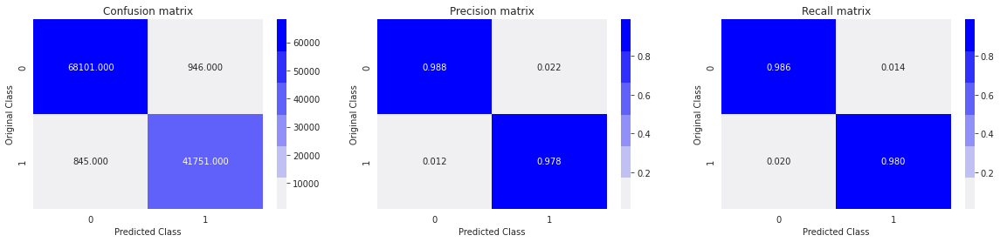

F1 score for test data:  0.9790017938166087
Recall for test data:  0.9801624565686919
Precision for test data:  0.9778438766189662


In [57]:
plot_confusion_matrix(df_y_test["PotentialFraud"], y_test_pred)
print("F1 score for test data: ", f1_score(df_y_test["PotentialFraud"], y_test_pred))
print("Recall for test data: ", recall_score(df_y_test["PotentialFraud"], y_test_pred))
print("Precision for test data: ", precision_score(df_y_test["PotentialFraud"], y_test_pred))

**Observation**

1) F1-Score for test data is 0.97, Recall for test data is 0.98, Precision for test 0.97.

2) We can make conclusion that Recall is better than Precision as well as F1_Score without overfitting or underfitting by comparing with train results.

# 9.4. Conclusion of Post Training Analysis:-

1) Large number of data points have been correctly classified almost 109852 and Less number of data points have been wrongly classified are almost 1791.

2) Majority of mis-classified points overlap with correctly classified points.

3) This suggests that it is very difficult to separate Positive and Negatives points distinctly at few regions.

4) In some cases, it is very difficult to identify Potentially Fraudulent Providers.

5) Non-Fradulent occur between Provider count 0 to 400 but Fraudulent is more which model predicted wrongly.

6) Non-Fradulent occur at State Code 0 to 10 and 30 to 40 but Fraudulent is more as per correct_predicted_data of this State Code which model predicted wrongly. 

7) When we plot for Provider vs Amount_left_reimburse, we can get idea that amount left reimburse between 0 to 75000 with provider code between 0 to 1000 there overlap between Fraudulent and Non-Fraudulent.

8) When we plot for AttendingPhysicain vs Amount_left_reimburse, we can get idea that amount left reimburse between 0 to 75000 with attendingPhysician code between 0 to 200 there overlap between Fraudulent and Non-Fraudulent.

9) We can make conclusion that majority of correct classified points for True positives has probability less than 0.5 while majority of correct classified points for True negatives has probability greater than 0.5 by best model. 

10) We can make conclusion that majority of wrong classified point for False positives has probability less than 0.5 while majority of wrong classified points for True negatives has probability greater than 0.5 by best model. 

11) Majority of misclassified points are at high Probability.

12) We can make conclusion that Recall is better than Precision as well as F1_Score without overfitting or underfitting by comparing with train results.
